In [38]:
from spatial_models import *
from spatial_indicators import *
from spatial_plotting import *

from IPython.display import HTML

# Load Simulation Snapshots

In [39]:
load = True  # set to true to load previous simulation results

if load:
    data = load_data('Results/spatial_simulation.dat')
    snapshots1, snapshots2, snapshots3, snapshots4 = data

# Local Positive Feedback Model

## Differential Equations

The local positive feedback model describes the dynamics of vegetation biomass $B$ and water moisture level $w$ by the stochastic differential equations:

$\frac{dw_{i,j}}{dt}=R-w_{i,j}-\lambda w_{i,j}B_{i,j}+D(w_{i+1,j}+w_{i-1,j}+w_{i,j+1}+w_{i,j-1}-4w_{i,j})+\sigma_w dW_{i,j}$

$\frac{dB_{i,j}}{dt}=\rho B_{i,j}\left(w_{i,j}-\frac{B_{i,j}}{B_c}\right)-\mu\frac{B_{i,j}}{B_{i,j}+B_0}+D(B_{i+1,j}+B_{i-1,j}+B_{i,j+1}+B_{i,j-1}-4B_{i,j})+\sigma_B dW_{i,j}$

## Euler-Maruyama Method

We use the Euler-Maruyama method with the explicit update equations:

$w_{i,j}^{n+1}=w_{i,j}^n+(R-w_{i,j}^n-\lambda w_{i,j}^n B_{i,j}+D(w_{i+1,j}^n+w_{i-1,j}^n+w_{i,j+1}^n+w_{i,j-1}^n-4w_{i,j}^n))\Delta t+\sigma_w\Delta W_{i,j}^n$

$B_{i,j}^{n+1}=B_{i,j}^n+\left(\rho B_{i,j^n}\left(w_{i,j}^n-\frac{B_{i,j}^n}{B_c}\right)-\mu\frac{B_{i,j}^n}{B_{i,j}^n+B_0}+D(B_{i+1,j}^n+B_{i-1,j}^n+B_{i,j+1}^n+B_{i,j-1}^n-4B_{i,j}^n)\right)\Delta t+\sigma_B\Delta W_{i,j}^n$

where $\Delta W_{i,j}\sim N(0,\Delta t)$.

## Simulation

We simulated a 100x100 lattice of the model with time step $\Delta t=0.1$ while slowly decreasing the rainfall value from $R=2$ to $R=0.8$ in steps of 0.01.

We started the simulation from a fully vegetated state. At each rainfall value, we simulated 100 time steps.

In [40]:
model1 = LocalPositiveFeedbackModel(size=100, dt=0.1)
R = np.arange(2, 0.8, -0.01)

if not load:
    snapshots1 = parameter_change(model1, R, "R", time_steps=100, warm_up=100)

## Visualisation

In [41]:
HTML(animate_snapshots(snapshots1, vmin=0, vmax=10).to_jshtml())


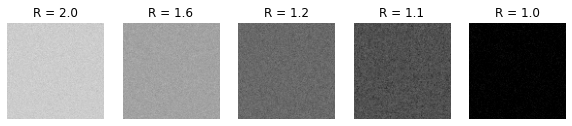

In [62]:
plot_snapshots(snapshots1, [2, 1.6, 1.2, 1.1, 1], "R", vmin=0, vmax=10)

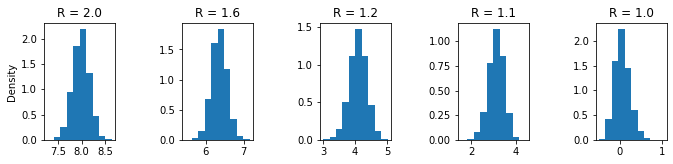

In [63]:
plot_distributions(snapshots1, [2, 1.6, 1.2, 1.1, 1], "R")

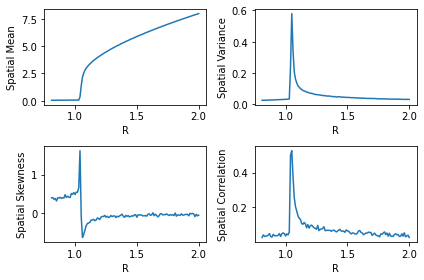

In [44]:
spatial_indicator_grid(snapshots1, "R")

## Observations

Vegetation biomass decreases as rainfall value decreases due to lower rainfall leading to reduced water and lower vegetation growth.

At $R\approx1.0$, desertification occurs as vegetation quickly decreases to zero. This is the point at which vegetation growth cannot compensate to losses due to grazing.

As we approach this transition, the local reactions at each cell become zero and thus diffusion between neighbours dominates. This causes neighbours to become more alike each and thus spatial correlation increases. Fluctuations around the equilibrium are stronger as they take longer to decay, thus spatial variance increases. Spatial skewness becomes more negative as the distribution skewed towards lower biomass values.

The system remains in a relatively homogeneous state with no pattern formation. This is due to the similar diffusivities of vegetation and water, which smoothens out differences between neighbours.

Biomass appear to be normal distributed far from the critical transition; this is to be expected due to the normal noise the model is subjected to and lack of pattern formation. The distribution appears to get wider and slightly left skewed as we near the critical transition. After the critical transition, the distribution becomes right skewed.

# Local Facilitation Model

## Transition Probabilities

The local facilitation model is a stochastic cellular automaton  describing the states of cells: vegetated (+), empty (0) or degraded (-). At each discrete time step, each cell in the grid can the following transformations with a certain probability:

1. Colonisation: $w_{[0,+]}=[\delta\rho_+ +(1-\delta)q_{+|0}](b-c\rho_+)$

2. Mortality: $w_{[+,0]}=m$

3. Degradation: $w_{[0,-]}=d$

4. Regeneration: $w_{[-,0]}=r+fq_{+|-}$

## Simulation

We simulated a 64x64 lattice of the model while slowly decreasing $b$ (increasing aridity) from $b=1$ to $b=0$ in steps of 0.01.

We started the simulation from a fully vegetated state. At each aridity level, we simulated 100 time steps.

Vegetation cover is obtained by dividing the lattice into 4x4 submatrices and calculating the vegetation density in each submatrix, hence obtaining a coarse-grained matrix.

In [45]:
model2 = LocalFacilitationModel(size=64)
b = np.arange(1, 0.3, -0.01)

if not load:
    snapshots2 = parameter_change(model2, b, "b", time_steps=100)

## Visualisation

In [46]:
HTML(animate_snapshots(snapshots2, vmin=-1, vmax=1).to_jshtml())

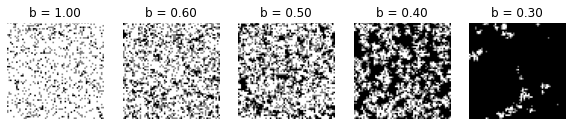

In [47]:
plot_snapshots(snapshots2, [1, 0.6, 0.5, 0.4, 0.3], "b", vmin=-1, vmax=1, precision=2)

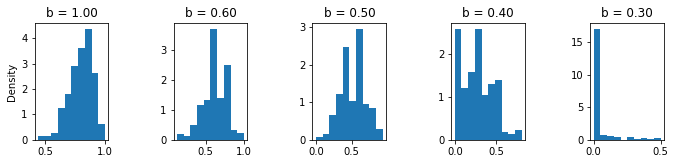

In [48]:
plot_distributions(model2.vegetation_cover(snapshots2), [1, 0.6, 0.5, 0.4, 0.3], "b", precision=2)

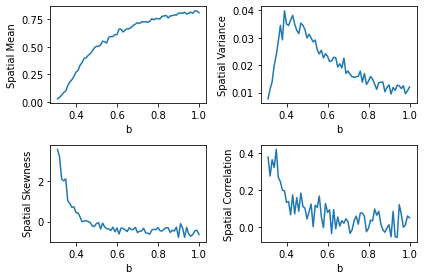

In [49]:
spatial_indicator_grid(model2.vegetation_cover(snapshots2), "b")

Text(0, 0.5, 'Vegetation Patchiness')

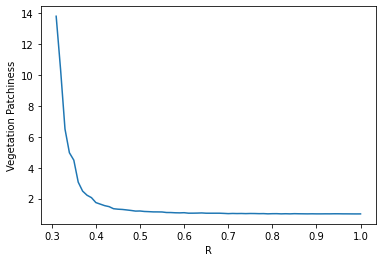

In [50]:
patchiness = model2.vegetation_patchiness(snapshots2)

fig, ax = plt.subplots()
ax.plot(patchiness)
ax.set_xlabel("R")
ax.set_ylabel("Vegetation Patchiness")

## Observations

As $b$ decreases (aridity increases), vegetation density decreases as colonisation of cells becomes more difficult.

At low aridity, vegetation is largely connected across the lattice. As higher aridity, areas of high vegetation break down into patches. As aridity continues to increase, these patches shrink and eventually disappear at the point of desertification.

At low aridity, spatial skewness is negative as most of the system consists of high vegetation cover. As aridity increases, spatial skewness becomes closer to zero as vegetation decreases and thus the distribution of vegetation cover becomes more symmetric. At high aridity, vegetation becomes scarce and thus spatial skewness increases.

At low aridity, most areas are highly vegetated so spatial variance is low. However, the formation of patches as aridity increases causes spatial variance and spatial correlation to increase. Just before collapse, spatial variance decreases as most of the system becomes bare.

Patchiness increases as aridity increases. Patchiness increases sharply near the point of desertification.

# Scale-dependent Feedback Model

## Differential Equations

The scale-dependent feedback model is a system of stochastic partial differential equations describing the dynamics of vegetation biomass $P$, soil water $W$ and surface water $O$:

$\frac{\partial O}{\partial t}=R(t)-\alpha O\frac{P+W_0 k_2}{P+k_2}+D_O\nabla^2O+\sigma dW$

$\frac{\partial W}{\partial t}=\alpha O\frac{P+W_0 k_2}{P+k_2}-g_{max}\frac{W}{W+k_1}P-r_W W+D_W\nabla^2W+\sigma dW$

$\frac{\partial P}{\partial t}=\left(cg_{max}\frac{W}{W+k_1}-d\right)P+D_P\nabla^2P+\sigma dW$

## Laplace Operator Approximation

The Laplace operator can be approximated by:

$\nabla^2 P_{i,j}=\frac{1}{\Delta x^2}(P_{i+1,j}+P_{i-1,j}+P_{i,j+1}+P_{i,j-1}-4P_{i,j})$

$\nabla^2 W_{i,j}=\frac{1}{\Delta x^2}(W_{i+1,j}+W_{i-1,j}+W_{i,j+1}+W_{i,j-1}-4W_{i,j})$

$\nabla^2 O_{i,j}=\frac{1}{\Delta x^2}[0.5(O_{i+1,j}+O_{i-1,j}+O_{i,j+1}+O_{i,j-1})+0.25(O_{i+1,j+1}+O_{i-1,j+1}+O_{i-1,j+1}+O_{i-1,j-1})-3O_{i,j}]$

We use the 5-point stencil for plant density $P$ and soil water $W$ as they behave smoothly. However, due to the fast dynamics of surface water $O$, we use the 9-point stencil to achieve numerical stability.

## Euler-Maruyama Method

We use the Euler-Maruyama method with the explicit update equations:

$O_{i,j}^{n+1}=O_{i,j}^n+\left(-\alpha O_{i,j}^n\frac{P_{i,j}^n+W_0 k_2}{P_{i,j}^n+k_2}+D_O\nabla^2O_{i,j}^n\right)\Delta t+\sigma\Delta W_{i,j}^n$

$W_{i,j}^{n+1}=W_{i,j}^n+\left(\alpha O_{i,j}^n\frac{P_{i,j}^n+W_0 k_2}{P_{i,j}^n+k_2}-g_{max}\frac{W_{i,j}^n}{W_{i,j}^n+k_1}P_{i,j}^n-r_W W_{i,j}^n+D_W\nabla^2W_{i,j}^n\right)\Delta t+\sigma\Delta W_{i,j}^n$

$P_{i,j}^{n+1}=P_{i,j}^n+\left(\left(cg_{max}\frac{W_{i,j}^n}{W_{i,j}^n+k_1}-d\right)P_{i,j}^n+D_P\nabla^2P_{i,j}^n\right)\Delta t+\sigma\Delta W_{i,j}^n$

where $\Delta W_{i,j}\sim N(0,\Delta t)$.

## Simulation

We simulated a 50x50 lattice of the model with spatial step size $\Delta x=5$ and time step $\Delta t=0.1$ while slowly decreasing the rainfall value from $R=1.5$ to $R=0.1$ in steps of 0.01.

We started the simulation from the homogeneous steady state. At each rainfall value, we simulated 1000 time steps.

In [51]:
model3 = ScaleDependentFeedbackModel(size=50, dt=0.1, dx=5)
R = np.arange(1.5, 0.1, -0.01)

if not load:
    snapshots3 = parameter_change(model3, R, "R", time_steps=1000)

## Visualisation

In [52]:
HTML(animate_snapshots(snapshots3, vmin=0, vmax=20).to_jshtml())

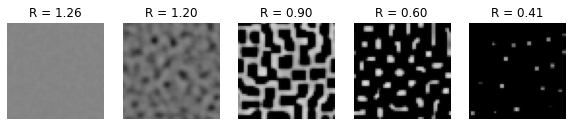

In [53]:
plot_snapshots(snapshots3, [1.26, 1.2, 0.9, 0.6, 0.41], "R", vmin=0, vmax=20, precision=2)

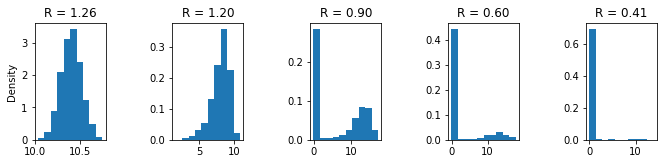

In [54]:
plot_distributions(snapshots3, [1.26, 1.2, 0.9, 0.6, 0.41], "R", precision=2)

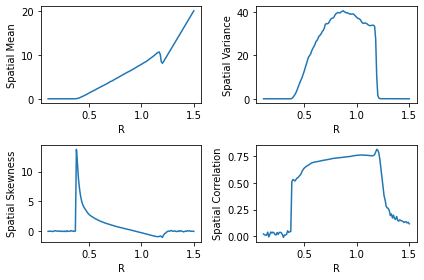

In [55]:
spatial_indicator_grid(snapshots3, "R")

## Observations

As rainfall value decreases, plant density decreases due to reduced plant growth from lower water levels.

At high rainfall, the system is relatively spatially homogeneous so that spatial variance and spatial skewness are near zero.

At $R\approx1.2$, pattern formation begins to occur. Spatial mean jumps up as patterns facilitate increased productivity of resources. The high regularity of patterns causes spatial variance and spatial correlation to greatly greatly increase. Spatial skewness drops as plant density skews towards low values due to the presence of gaps.

The patterns then go from gaps to labyrinths to spots. Spatial variance remains high but starts decreasing when spots emerge. Spatial correlation remains high through the sequence of patterns. Spatial skewness increases as the number of bare cells increases due to loss in vegetation. Plant density decreases at a lower rate than before due to increased productivity.

As we approach the point of collapse at $R\approx0.4$ when plant density goes to zero, spatial variance also goes to zero as the system becomes uniformly desert. Spatial correlation sharply drops to zero due to the breaking down of patterns. Spatial skewness sharply increases.

## Issues

The simulation initially didn't produce any patterns, so I tried implementing the Turing model (below), which has 2 variables instead of 3 variables, to see if there was a problem with the numerical method. The Turing model managed to produce spots.

I found that unless the time step was extremely small, then the numerical scheme was likely to get unstable. However, an extremely small time step meant that it took too long to simulate the model long enough for pattern formation to occur.

I tried implementing a semi-implicit method instead of an explicit method as it would be more numerically stable and thus not need an extremely small time step. However, it was too complicated and time-consuming to solve multiple equations in a grid, so I opted to stick to the explicit method.

I found that the numerical instability is due to diffusion; in particular, surface water level $O$ which has high diffusion. Increasing the spatial step size allowed the time step to be larger, but it still needed to be very small.

I found that the 5-point stencil approximation for the Laplace operator was only stable for smoothly varying fields, which surface water is not. Thus, I used the more isotropic and stable 9-point stencil for the diffusion of surface water instead. This allowed a much larger time step so that a long enough time for pattern formation to occur can be simulated.

# Turing Model

## Differential Equations

The Turing model is a system of stochastic version of the partial differential equation system with two species, the activator $u$ and the inhibitor $v$:

$\frac{\partial u}{\partial t}=u(avu-e)+\nabla^2u+\sigma dW$

$\frac{\partial v}{\partial t}=v(b-cu^2v)+d\nabla^2v+\sigma dW$

## Laplace Operator Approximation

The Laplace operator can be approximated by:

$\nabla^2 u_{i,j}=\frac{1}{\Delta x^2}(u_{i+1,j}+u_{i-1,j}+u_{i,j+1}+u_{i,j-1}-4u_{i,j})$

$\nabla^2 v_{i,j}=\frac{1}{\Delta x^2}[0.5(v_{i+1,j}+v_{i-1,j}+v_{i,j+1}+v_{i,j-1})+0.25(v_{i+1,j+1}+v_{i-1,j+1}+v_{i-1,j+1}+v_{i-1,j-1})-3v_{i,j}]$

We use the 5-point stencil for the activator $u$ as it behaves smoothly. However, due to the fast diffusion of the inhibitor $v$, we use the 9-point stencil to achieve numerical stability.

## Euler-Maruyama Method

We use the Euler-Maruyama method with the explicit update equations:

$u_{i,j}^{n+1}=u_{i,j}^n+(u_{i,j}^n(av_{i,j}^n u_{i,j}^n-e)+\nabla^2u_{i,j})\Delta t+\sigma\Delta W_{i,j}^n$

$v_{i,j}^{n+1}=v_{i,j}^n+(v_{i,j}^n(b-c(u_{i,j}^n)^2v_{i,j}^n)+d\nabla^2v_{i,j}^n)\Delta t+\sigma\Delta W_{i,j}^n$

where $\Delta W_{i,j}\sim N(0,\Delta t)$.

## Simulation

We simulated a 50x50 lattice of the model with spatial step size $\Delta x=0.25$ and time step $\Delta t=0.001$ while slowly decreasing the parameter $b$ from 100 to 25 in steps of 1.

We started the simulation from the homogeneous steady state. At each $b$ value, we simulated 1000 time steps.

In [56]:
model4 = TuringModel(size=50, dt=0.001, dx=0.25, sigma=0.1)
b = np.arange(100, 25, -1)

if not load:
    snapshots4 = parameter_change(model4, b, "b", time_steps=1000)

## Visualisation

In [57]:
HTML(animate_snapshots(snapshots4, vmin=0, vmax=1).to_jshtml())

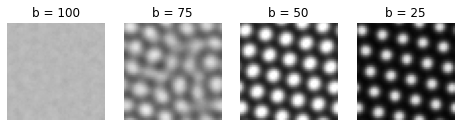

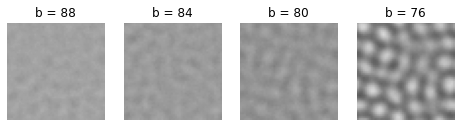

In [58]:
plot_snapshots(snapshots4, [100, 75, 50, 25], "b", vmin=0, vmax=1.5, precision=0)
plot_snapshots(snapshots4, [88, 84, 80, 76], "b", vmin=0, vmax=1.5, precision=0)

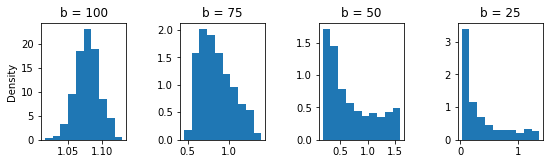

In [59]:
plot_distributions(snapshots4, [100, 75, 50, 25], "b", precision=0)

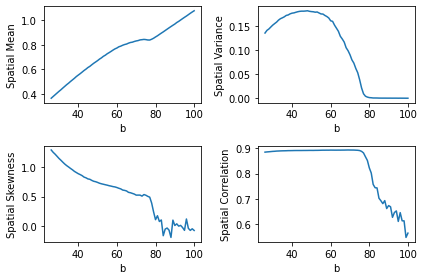

In [60]:
spatial_indicator_grid(snapshots4, "b")

## Observations

A lower $b$ value reduces the growth rate of $v$. A lower $v$ thus then reduces the growth rate of $u$, hence the decrease in $u$ as $b$ decreases.

At high $b$ values, the system is relatively spatially homogeneous. Spatial variance and spatial skewness are near zero

At $b\approx80$, spots start to form in a hexagonal arrangement, which slows down the decrease of $u$. Spatial variance increases due to the presence of both vegetated and bare soil. Spatial correlation greatly increases due to the high regularity of patterns.

As $b$ continues to decrease, the spots get smaller. Spatial correlation remains high as the patterns remain regular. Spatial skewness continues increasing as the number of bare cells increases due to loss of vegetation.

I did not simulate this model to the point of collapse.

# Save Simulation Snapshots

In [61]:
save = False  # set to True to save current simulation results

if save:
    data = (snapshots1, snapshots2, snapshots3, snapshots4)
    save_data('Results/spatial_simulation.dat', data)